In [1]:
%load_ext autoreload
%autoreload 2


In [2]:
!ls

'Distributed Blog Post.ipynb'	  'Yolox blog post.ipynb'
'Effdet blog post.ipynb'	   slicing_investigation.ipynb
'Recommender Prepare data.ipynb'   timm.ipynb
'Recommender blog post.ipynb'	   yolox_cars.ipynb
'Slicing Blog post.ipynb'	   yolox_cars_.ipynb
'Yolo7 blog post.ipynb'


In [4]:
!ls ../Yolov7-training

Dockerfile	__pycache__    coco_dataset	       model_configs
LICENSE		batches        evaluate_coco.py        yolov7
README.md	best_model.pt  example
Untitled.ipynb	cars.ipynb     extract_state_dicts.py


In [2]:
import sys
sys.path.append('../Yolov7-training')

# YOLOv7 blog post

Why Yolov7? At the time of writing, best performing object detection repo.

Additionally, YoloX is trained from scratch, which means that it may be useful for domains that do not resemble imagenet/coco.

Whilst it can be easy to get good results with minimal effort by using the authors' implementation, I recently found myself in a situation where I was interested in extending the functionality contained in the repository; incorporating domain specific augmentation techniques and custom logging. Whilst it may be possible to incorporate these changes into the original codebase, in cases where extensive modifications are required, I often find that it is more straightforward to write a custom training script.

The Yolov7 repo is forked from yolov5 repo, it includes a lot of functionality and contains many custom components - such as a Multi-GPU training loop, several augmentations, and multiple learning rate schedulers -  which have been implemented from scratch. As a result, there is a lot of code to understand; it took me a long time to understand how everything worked, as well as the intracies of the training loop which contribute to the model's excellent performance! 

Here, I shall use the model from torch hub as our starting point, before gradually implementing the rest of the training loop from scratch. Hopefully this implementation will provide a clean and clear starting point for anyone wishing to experiment with YoloX in their own custom training scripts, as well as providing more transparency around the techniques that were used during training in the original implementation. The intracies of how Yolov7 works are beyond the scope of this article.

## Define plotting helper functions

## Select a dataset

As an example, I shall use the Kaggle cars object detection dataset; however, as my aim is to demonstrate how Yolov7 can be applied to any problem, this is really the least important part of this work.

As this dataset is quite small, and the designated test set is unlabeled, for simplicity I shall focus on training and evaluating the model on the training set. While this is never something that should be done in practice as a method to evaluate a model’s performance, it is a useful trick to test whether the model is capable of learning the task; if the model is unable to overfit on the training set, it clearly does not have the capability to learn the task and we can expect poor performance when the model is used on new data.

The annotations for this dataset are in the form of a .csv file, which associates the image name with the corresponding annotations, and we can view the format of this by loading it into a pandas DataFrame.

In [3]:
from pathlib import Path

import pandas as pd

In [4]:
data_path = "/home/chris/Downloads/data"
data_path = Path(data_path)
images_path = data_path / "training_images"
annotations_file_path = data_path / "annotations.csv"

In [5]:
from example.data import load_cars_df

Lets create a function to load the annotations, Here, I am adding 100 images to the dataset which do not contain cars, to demonstrate how to handle negative images.  

In [6]:
??load_cars_df

Signature: load_cars_df(annotations_file_path, images_path)
Docstring: <no docstring>
Source:   
def load_cars_df(annotations_file_path, images_path):
    all_images = sorted(set([p.parts[-1] for p in images_path.iterdir()]))
    image_id_to_image = {i: im for i, im in enumerate(all_images)}
    image_to_image_id = {v: k for k, v, in image_id_to_image.items()}

    annotations_df = pd.read_csv(annotations_file_path)
    annotations_df.loc[:, "class_name"] = "car"
    annotations_df.loc[:, "has_annotation"] = True

    # add 100 empty images to the dataset
    empty_images = sorted(set(all_images) - set(annotations_df.image.unique()))
    non_annotated_df = pd.DataFrame(list(empty_images)[:100], columns=["image"])
    non_annotated_df.loc[:, "has_annotation"] = False
    non_annotated_df.loc[:, "class_name"] = "background"

    df = pd.concat((annotations_df, non_annotated_df))

    class_id_to_label = dict(enumerate(df.query('has_annotation == True').class_name.unique()))
    class_lab

In [7]:
train_df, valid_df, lookups = load_cars_df(annotations_file_path, images_path)

In [8]:
train_df.head()

,image,xmin,ymin,xmax,ymax,class_name,has_annotation,image_id,class_id
0,vid_4_1000.jpg,281.259045,187.035071,327.727931,223.225547,car,True,0,0.0
1,vid_4_10000.jpg,15.163531,187.035071,120.329957,236.430180,car,True,1,0.0
2,vid_4_10040.jpg,239.192475,176.764801,361.968162,236.430180,car,True,3,0.0
4,vid_4_10060.jpg,16.630970,186.546010,132.558611,238.386422,car,True,4,0.0
5,vid_4_10100.jpg,447.568741,160.625804,582.083936,232.517696,car,True,6,0.0


In [9]:
train_df.has_annotation.value_counts(), valid_df.has_annotation.value_counts()

(True     397
 False     68
 Name: has_annotation, dtype: int64,
 True     162
 False     32
 Name: has_annotation, dtype: int64)

In [10]:
train_df.class_name.value_counts()

car           397
background     68
Name: class_name, dtype: int64

## Create a Dataset Adaptor

Usually, at this point, we would create a PyTorch dataset specific to the model that we shall be training. 

However, I often find it helpful to first create a dataset 'adaptor' class, with the sole responsibility of wrapping the underlying data sources and loading this approriately. This way, we can easily switch out adaptors when using different datasets.

Therefore, let’s focus for now on creating a CarsDatasetAdaptor class, which converts the specific raw dataset format into an image and corresponding annotations. An implementation of this is presented below:

In [11]:
from example.data import DatasetAdaptor

In [12]:
??DatasetAdaptor

Init signature: DatasetAdaptor(images_dir_path, annotations_dataframe, transforms=None)
Docstring:     
An abstract class representing a :class:`Dataset`.

All datasets that represent a map from keys to data samples should subclass
it. All subclasses should overwrite :meth:`__getitem__`, supporting fetching a
data sample for a given key. Subclasses could also optionally overwrite
:meth:`__len__`, which is expected to return the size of the dataset by many
:class:`~torch.utils.data.Sampler` implementations and the default options
of :class:`~torch.utils.data.DataLoader`.

.. note::
  :class:`~torch.utils.data.DataLoader` by default constructs a index
  sampler that yields integral indices.  To make it work with a map-style
  dataset with non-integral indices/keys, a custom sampler must be provided.
Source:        
class DatasetAdaptor(Dataset):
    def __init__(
            self,
            images_dir_path,
            annotations_dataframe,
            transforms=None,
    ):
        

In [13]:
ds = DatasetAdaptor(images_path, train_df)

In [14]:
len(ds)

324

In [15]:
from yolov7.plotting import show_image

INFO:pytorch_accelerated:Setting random seeds


In [16]:
lookups.keys()

dict_keys(['image_id_to_image', 'image_to_image_id', 'class_id_to_label', 'class_label_to_id'])

In [17]:
lookups['class_id_to_label']

{0: 'car'}

In [18]:
lookups['class_label_to_id']

{'car': 0}

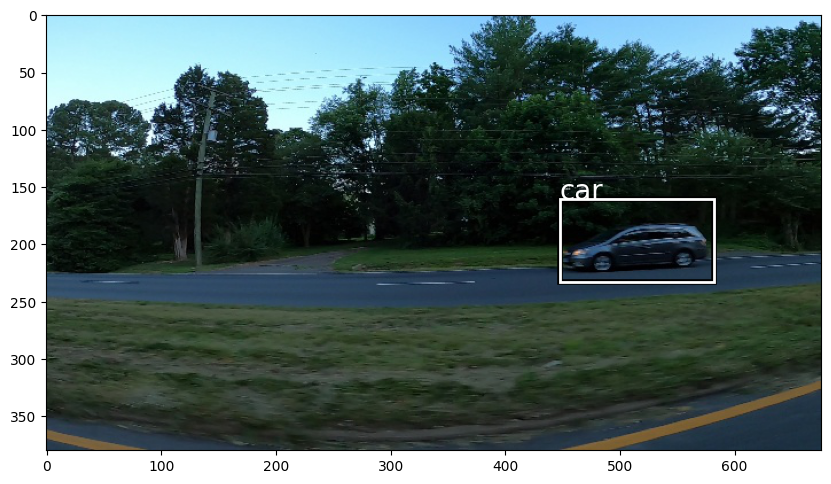

Image id: 6
Image size: (380, 676)


In [19]:
idx = 4
image, xyxy_bboxes, class_ids, image_idx, image_size = ds[idx]
show_image(image, xyxy_bboxes.tolist(), [lookups['class_id_to_label'][int(c)] for c in class_ids])
print(f'Image id: {image_idx}')
print(f'Image size: {image_size}')

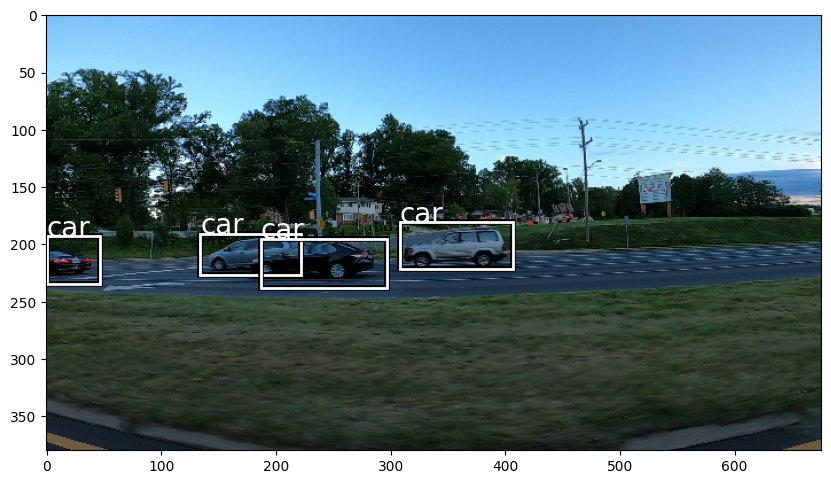

Image id: 848
Image size: (380, 676)


In [20]:
idx = 204
image, xyxy_bboxes, class_ids, image_idx, image_size = ds[idx]
show_image(image, xyxy_bboxes.tolist(), [lookups['class_id_to_label'][int(c)] for c in class_ids])
print(f'Image id: {image_idx}')
print(f'Image size: {image_size}')

## Create Yolov7 dataset

Yolo7 expects labels in cxcywh format

In [21]:
from yolov7.dataset import Yolov7Dataset

In [22]:
??Yolov7Dataset

Init signature: Yolov7Dataset(dataset, transforms=None)
Docstring:     
An abstract class representing a :class:`Dataset`.

All datasets that represent a map from keys to data samples should subclass
it. All subclasses should overwrite :meth:`__getitem__`, supporting fetching a
data sample for a given key. Subclasses could also optionally overwrite
:meth:`__len__`, which is expected to return the size of the dataset by many
:class:`~torch.utils.data.Sampler` implementations and the default options
of :class:`~torch.utils.data.DataLoader`.

.. note::
  :class:`~torch.utils.data.DataLoader` by default constructs a index
  sampler that yields integral indices.  To make it work with a map-style
  dataset with non-integral indices/keys, a custom sampler must be provided.
Source:        
class Yolov7Dataset(Dataset):
    def __init__(self, dataset, transforms=None):
        self.ds = dataset
        self.transforms = transforms

    def __len__(self):
        return len(self.ds)

    def loa

In [23]:
yolo_ds = Yolov7Dataset(ds)

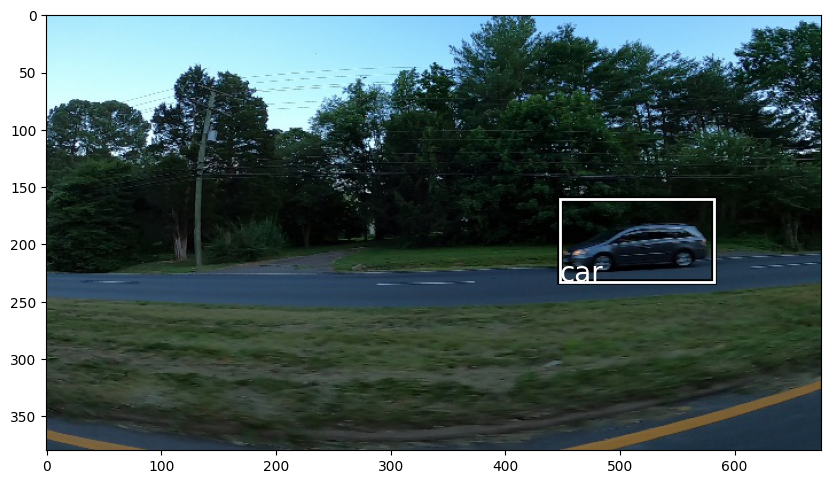

Image id: 6
Image size: tensor([380, 676])


In [24]:
idx = 4
image_tensor, labels, image_id, image_size = yolo_ds[idx]

boxes = labels[:, 2:]
boxes[:, [0, 2]] *= image_size[1]
boxes[:, [1, 3]] *= image_size[0]

show_image(image_tensor.permute( 1, 2, 0), boxes.tolist(), [lookups['class_id_to_label'][int(c)] for c in labels[:, 1]], 'cxcywh')
print(f'Image id: {image_id}')
print(f'Image size: {image_size}')

As we haven't defined any transforms, the output is largely the same, with the main exception being that the boxes are now in normalized cxcywh format and everything has been converted to a tensor.

### Transforms

Now, let's define some transforms! For this, we shall use the excellent Albumentations library, which provides many options for transforming both images and bounding boxes.

Whilst we are largely free to define whichever transforms we like, dependent on the domain, for simplicity let's define similary transforms to those used in the original implementation.

These are:
- resize the image to the given input (multiple of 640) whilst maintaining the aspect ratio
- If the image is not square, apply padding. For this, we shall follow the paper in using a grey padding, this is an arbitary choice.

During training:
- horizontal flip.


In [25]:
from yolov7.dataset import create_yolov7_transforms

Potential todo, add param to add extra transforms

In [26]:
??create_yolov7_transforms

Signature:
create_yolov7_transforms(
    image_size=(1280, 1280),
    flip_prob=0.5,
    training=False,
)
Docstring: <no docstring>
Source:   
def create_yolov7_transforms(image_size=(1280, 1280), flip_prob=0.5, training=False):
    transforms = [
        A.LongestMaxSize(max(image_size)),
        A.PadIfNeeded(
            image_size[0],
            image_size[1],
            border_mode=0,
            value=(114, 114, 114),
        ),
        # A.Resize(640, 640)
    ]

    if training:
        transforms.extend(
            [
                A.HorizontalFlip(p=flip_prob),
            ]
        )

    return A.Compose(
        transforms,
        bbox_params=A.BboxParams(format="pascal_voc", label_fields=["labels"]),
    )
File:      ~/notebooks/Yolov7-training/yolov7/dataset.py
Type:      function


In [27]:
target_image_size = 640

In [28]:
yolo_ds = Yolov7Dataset(ds, transforms=create_yolov7_transforms(image_size=(target_image_size, target_image_size)))

In [29]:
image_tensor.shape

torch.Size([3, 380, 676])

In [30]:
image_tensor.shape

torch.Size([3, 380, 676])

In [31]:
image_size

tensor([380, 676])

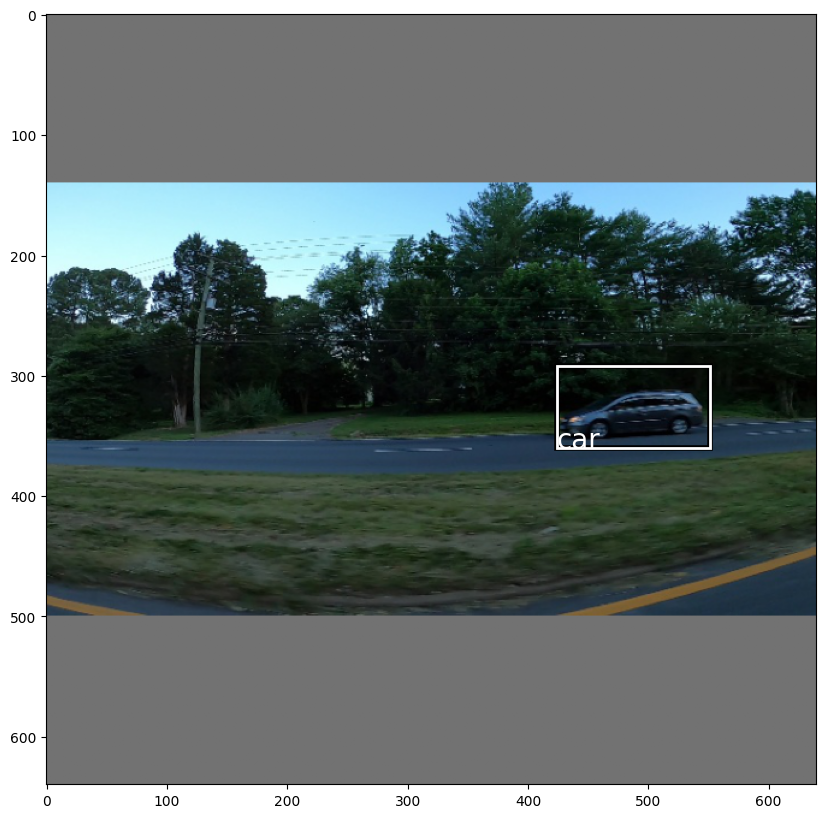

Image id: 6
Original Image size: tensor([380, 676])
Resized Image size: torch.Size([640, 640])


In [32]:
idx = 4
image_tensor, labels, image_id, image_size = yolo_ds[idx]

boxes = labels[:, 2:]
boxes[:, [0, 2]] *= target_image_size
boxes[:, [1, 3]] *= target_image_size

show_image(image_tensor.permute( 1, 2, 0), boxes.tolist(), [lookups['class_id_to_label'][int(c)] for c in labels[:, 1]], 'cxcywh')
print(f'Image id: {image_id}')
print(f'Original Image size: {image_size}')
print(f'Resized Image size: {image_tensor.shape[1:]}')

## Loading the model

So that we can understand how to interface with the model, let's load a pretrained checkpoint and use this for inference on some images in our dataset. As this checkpoint was trained on coco, which contains images of cars, we can assume that the model should perform moderately well on this task out of the box.

In [33]:
from yolov7 import create_yolov7_model

In [34]:
model = create_yolov7_model('yolov7')

Transferred 564/566 items from https://github.com/Chris-hughes10/Yolov7-training/releases/download/alpha/yolov7_training_state_dict.pt


In [35]:
model.eval()

Yolov7Model(
  (model): Sequential(
    (0): Conv(
      (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
      (act): SiLU(inplace=True)
    )
    (1): Conv(
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
      (act): SiLU(inplace=True)
    )
    (2): Conv(
      (conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
      (act): SiLU(inplace=True)
    )
    (3): Conv(
      (conv): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(128, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
      (act): SiLU(inplace=True)
    )
    (4): Co

let's take a look at the model's predictions

In [36]:
import torch

with torch.no_grad():
    model_outputs = model(image_tensor[None])
    inference_outputs, rpn_outputs = model_outputs

In [37]:
inference_outputs.shape

torch.Size([1, 25200, 85])

Inspecting the shape, we can see that the model has made 25200 predictions! Each prediction has an associated tensor of length 85 - the first 4 entries correspond to the bounding box coordinates in cxcywh format, an object confidence socre, with the remaining entries representing a confidence score for each class that the model has been trained on. Here, to make the number of predictions more manageable, I shall filter any predictions with a confidence below a predefined theshold. To understand how the model is performing, I have set this quite low by default. 

To make it easier to interpret the model outputs, let's define a post processing function to unpack these predictions. 

Finally, let's convert our prediction format to xxyx, as I personally find this the most intiuitive.

In [38]:
from yolov7.models.yolo import process_yolov7_outputs

In [39]:
??process_yolov7_outputs

Signature:
process_yolov7_outputs(
    model_outputs,
    conf_thres=0.001,
    max_detections=30000,
    multiple_labels_per_box=True,
)
Docstring: <no docstring>
Source:   
def process_yolov7_outputs(
        model_outputs, conf_thres=0.001, max_detections=30000, multiple_labels_per_box=True
):
    # TODO move this function inside the model
    model_outputs = model_outputs[0]
    num_classes = model_outputs.shape[2] - 5

    outputs = [torch.zeros((0, 6), device=model_outputs.device)] * model_outputs.shape[
        0
    ]

    for image_idx, detections_for_image in enumerate(
            model_outputs
    ):  # image index, image inference

        # filter by confidence
        detections_for_image = detections_for_image[
            detections_for_image[:, 4] >= conf_thres
            ]

        # If none remain process next image
        if not detections_for_image.shape[0]:
            continue

        if num_classes == 1:
            detections_for_image[:, 5:] = detections_f

In [40]:
processed_predictions = process_yolov7_outputs(model_outputs, conf_thres=0.1)

In [41]:
processed_predictions

[tensor([[4.2501e+02, 3.1203e+02, 5.4695e+02, 3.5355e+02, 1.3396e-01, 2.0000e+00],
         [4.2561e+02, 3.1228e+02, 5.4716e+02, 3.5305e+02, 9.1770e-01, 2.0000e+00],
         [4.2542e+02, 3.1231e+02, 5.4670e+02, 3.5306e+02, 9.4651e-01, 2.0000e+00],
         [4.2528e+02, 3.1211e+02, 5.4667e+02, 3.5300e+02, 9.4794e-01, 2.0000e+00],
         [4.2574e+02, 3.1224e+02, 5.4716e+02, 3.5308e+02, 9.3330e-01, 2.0000e+00],
         [4.2544e+02, 3.1227e+02, 5.4663e+02, 3.5309e+02, 9.4304e-01, 2.0000e+00],
         [4.2531e+02, 3.1213e+02, 5.4662e+02, 3.5300e+02, 9.5174e-01, 2.0000e+00],
         [4.2559e+02, 3.1202e+02, 5.4721e+02, 3.5306e+02, 2.1777e-01, 2.0000e+00],
         [4.2541e+02, 3.1222e+02, 5.4666e+02, 3.5316e+02, 9.3995e-01, 2.0000e+00],
         [4.2535e+02, 3.1199e+02, 5.4661e+02, 3.5314e+02, 9.4261e-01, 2.0000e+00],
         [4.2548e+02, 3.1209e+02, 5.4653e+02, 3.5326e+02, 3.8395e-01, 2.0000e+00]])]

After applying our processing, we can see that the number of predictions has been reduced significantly! However, inspecting the boxes by eye we can see that they all look very similar, with lots of overlap! To remove overlapping predictions, let's apply NMS to this output. We can define a function to do this as demonstrated below:

In [42]:
from typing import List

import torchvision
from torch import Tensor

def filter_eval_predictions(predictions: Tensor,
                            confidence_threshold: float = 0,
                            nms_threshold: float = 0.1) -> List[Tensor]:
    nms_preds = []
    for pred in predictions:
        pred = pred[pred[:, 4] > confidence_threshold]

        nms_idx = torchvision.ops.batched_nms(
            boxes=pred[:, :4],
            scores=pred[:, 4],
            idxs=pred[:, 5],
            iou_threshold=nms_threshold,
        )
        nms_preds.append(pred[nms_idx])

    return nms_preds

In [43]:
nms_predictions = filter_eval_predictions(processed_predictions)

In [44]:
nms_predictions

[tensor([[425.3130, 312.1302, 546.6226, 352.9976,   0.9517,   2.0000]])]

After applying NMS, we can see that now we only have a single prediction for this image. Let's visualise how this looks:

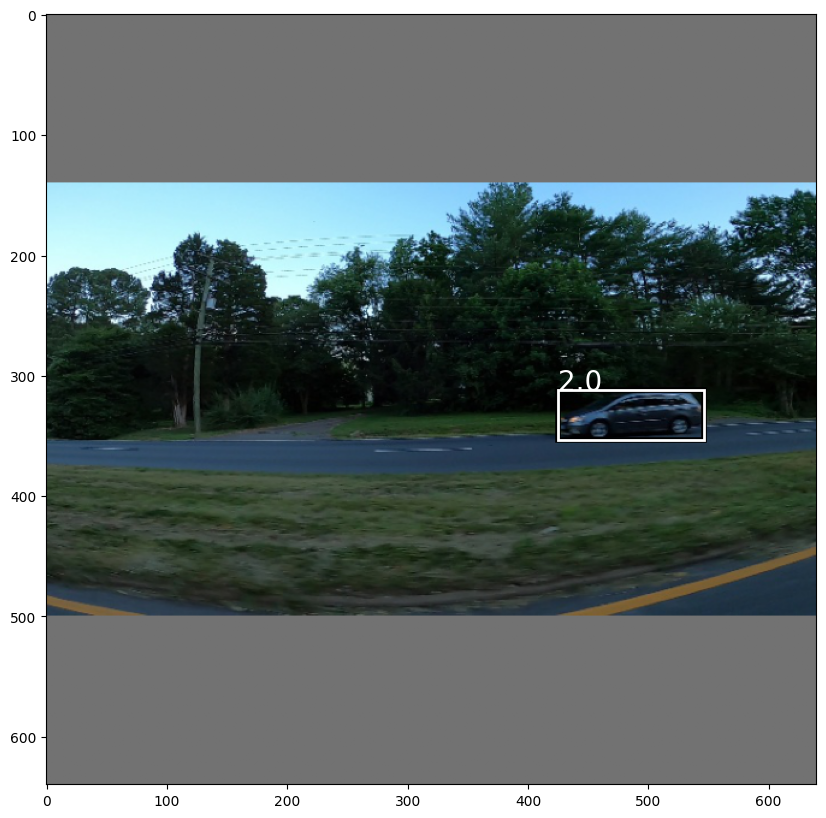

Image id: 6
Original Image size: tensor([380, 676])
Resized Image size: torch.Size([640, 640])


In [45]:

boxes = nms_predictions[0][:, :4]
class_ids = nms_predictions[0][:, -1]

show_image(image_tensor.permute( 1, 2, 0), boxes.tolist(), class_ids.tolist())
print(f'Image id: {image_id}')
print(f'Original Image size: {image_size}')
print(f'Resized Image size: {image_tensor.shape[1:]}')

We can see that this looks pretty good! The prediction from the model is actually tighter around the car than the ground truth!

## Training the model

To obtain the level of performance reported in the paper, Yolov7 was trained using a variety of techniques. However, for our purposes, lets start with the minimal possible training loop required, before gradually introducing different techniques. 

To handle the boilerplate aspects of the training loop, let's use PyTorch-accelerated. This will enable us to define only the the parts of the training loop which are relevant to our use case, without having to manage all of the boilerplate.

Let's override the default `Trainer` and create a trainer specific to our YoloX model. Our training step is quite straightforward, with the only modification being that we need to extract the total loss from the dictionary that is returned. For the evaluation step, we first calculate the losses, and then retrieve the detections.

Additionally, let's define a method to transform our targets into a similar format to our predictions, this will make our evaluation easier.

In [197]:
from yolov7.trainer import Yolov7Trainer

In [198]:
??Yolov7Trainer

Init signature:
Yolov7Trainer(
    model,
    loss_func,
    eval_loss_func,
    optimizer,
    callbacks,
    filter_eval_predictions=None,
)
Docstring:     
The Trainer is designed to encapsulate an entire training loop for a specific task, bringing together the model,
loss function and optimizer, and providing a specification of the behaviour to execute for each step of the training
process.

The trainer has been implemented such that it provides (overridable) implementations of the parts of training
that rarely change after they have been defined – such as creating a data loader, or how a batch of data is fed to
the model – whilst remaining decoupled from components that are likely to change, such as the model, dataset,
loss function and optimizer.
Source:        
class Yolov7Trainer(Trainer):
    YOLO7_PADDING_VALUE = -2.0

    def __init__(
            self,
            model,
            loss_func,
            eval_loss_func,
            optimizer,
            callbacks,
       

### Calculating mAP

To calculate the Mean Average Precision at each epoch, we can use the the class included in Pycocotools. However, as this doesn not have the most inituitive interface, and requires coco formatted json files to use we can create a simple wrapper around this

In [200]:
from yolov7.evaluation import COCOMeanAveragePrecision

In [201]:
??COCOMeanAveragePrecision

Init signature: COCOMeanAveragePrecision(iou_threshold: float = None, verbose=False)
Source:        
class COCOMeanAveragePrecision:
    """Mean Average Precision for single IoU threshold based on pycocotools

    :param iou_threshold: IoU threshold for which we want to calculate mAP.
    """

    # Box area range is a concept needed for benchmarking models, we do not need that.
    # Thus, we pick one that can just fit any prediction.
    AREA_RANGE = np.array([0**2, 1e5**2])
    AREA_RANGE_LABEL = "all"
    # Maximum number of predictions we account for each image.
    MAX_PREDS = 100

    def __init__(self, iou_threshold: float = None, verbose=False):
        self.foreground_threshold = iou_threshold
        self.verbose = verbose
        self.silencer = Silencer()

    def __call__(self, targets_json: pd.DataFrame, preds_json) -> float:
        """Calculate mAP from json files"""
        mAP = self.compute(targets_json, preds_json)
        return mAP

    def compute_from_dfs(
    

To encapsulate this logic, let's create a callback for this, which will be updated at the end of each evaluation step and then calculated at the end of each evaluation epoch.

In [202]:
from yolov7.evaluation import CalculateMetricsCallback

In [203]:
??CalculateMetricsCallback

Init signature:
CalculateMetricsCallback(
    targets_json,
    iou_threshold=None,
    save_predictions_output_dir_path=None,
    verbose=False,
)
Docstring:      The abstract base class to be subclassed when creating new callbacks.
Source:        
class CalculateMetricsCallback(TrainerCallback):
    def __init__(
        self,
        targets_json,
        iou_threshold=None,
        save_predictions_output_dir_path=None,
        verbose=False,
    ):

        self.evaluator = COCOMeanAveragePrecision(iou_threshold)
        self.targets_json = targets_json
        self.verbose = verbose
        self.save_predictions_path = (
            Path(save_predictions_output_dir_path)
            if save_predictions_output_dir_path is not None
            else None
        )

        self.eval_predictions = []
        self.image_ids = set()

    def on_eval_step_end(self, trainer, batch, batch_output, **kwargs):
        predictions = batch_output["predictions"]
        self.update(predictions)

In [13]:
#TODO: mAP callback

### Run training

Use cosine scheduler. PyTorch-accelerated contains a flexible implementation of this. Following the original implementation, let's use warm up and cooldown epochs

- train from pretrained, train from scratch

## Training techniques

### Mosaic Augmentation

In [46]:
import albumentations as A

In [47]:
def create_base_transforms(target_image_size):
    return A.Compose(
        [
            A.LongestMaxSize(target_image_size),
        ],
        bbox_params=A.BboxParams(format="pascal_voc", label_fields=["labels"]),
    )

In [271]:
ds = DatasetAdaptor(images_path, train_df,
                    transforms=create_base_transforms(640)
                   )

In [272]:
from yolov7.mosaic import MosaicBuilder, MosaicMixupDataset

In [273]:
mds = MosaicMixupDataset(ds, apply_mixup_probability=0)

In [275]:
def plot_mosaic(idx):
    image, xyxy_bboxes, class_ids, image_ids, image_size = mds[idx]
    show_image(image, xyxy_bboxes.tolist(), [lookups['class_id_to_label'][int(c)] for c in class_ids])
    print(f'Image id: {image_idx}')
    print(f'Original Image size: {image_size}')
    print(f'Image size: {image.shape}')

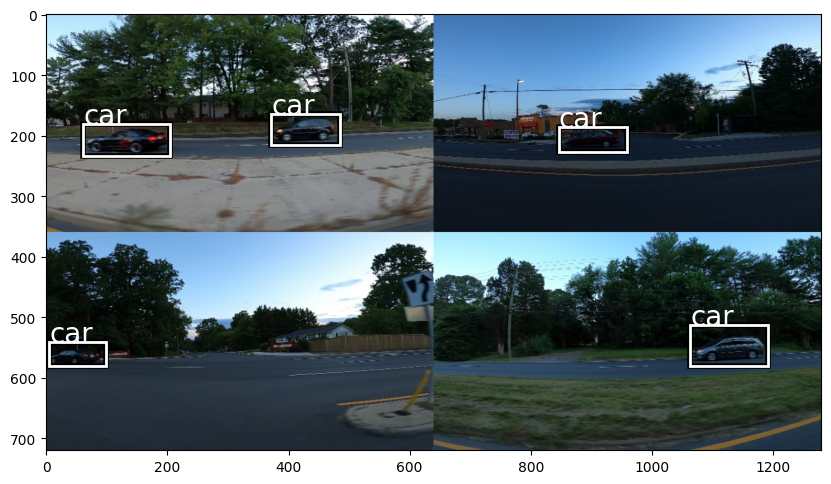

Image id: 848
Original Image size: (720, 1280)
Image size: (720, 1280, 3)


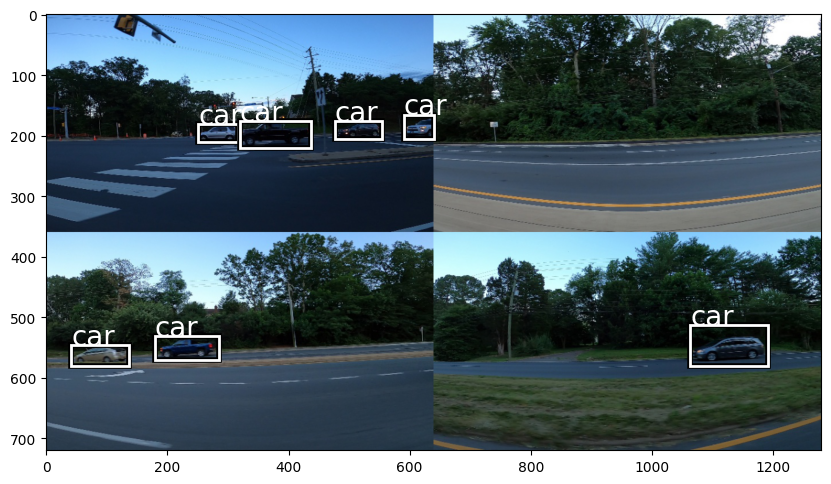

Image id: 848
Original Image size: (720, 1280)
Image size: (720, 1280, 3)


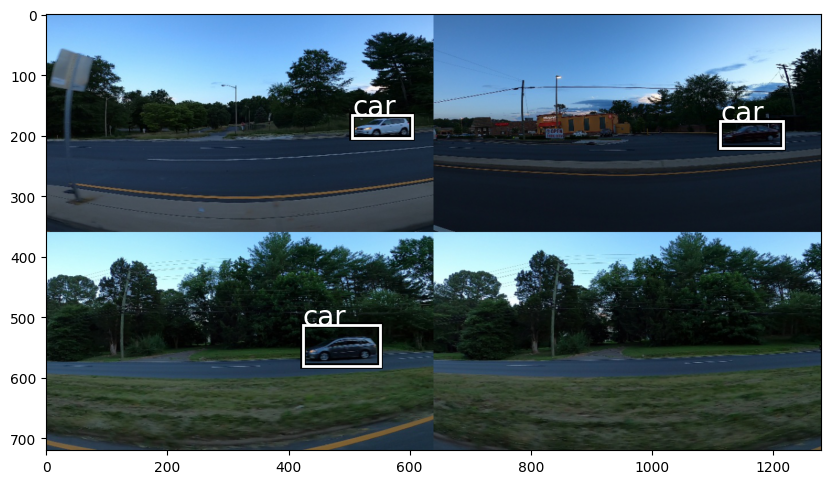

Image id: 848
Original Image size: (720, 1280)
Image size: (720, 1280, 3)


In [277]:
for i in range(3):
    plot_mosaic(4)

In [278]:
mds.enable(apply_mosaic_probability=0, apply_mixup_probability=1)

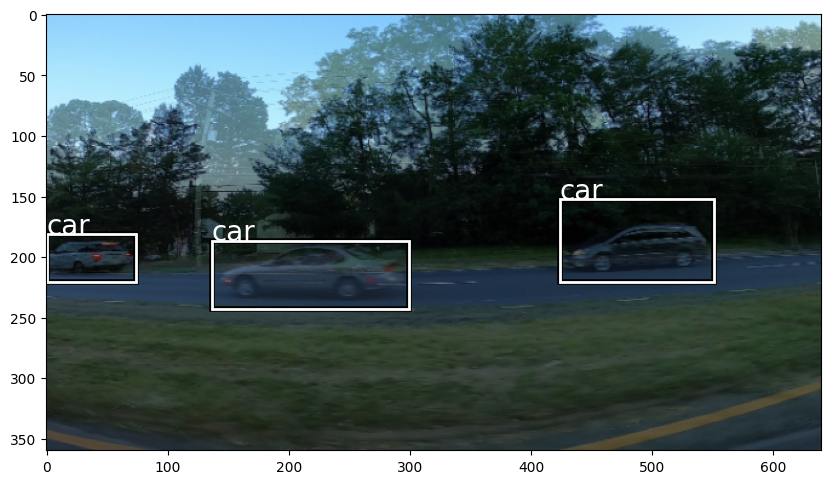

Image id: 848
Original Image size: (380, 676)
Image size: (360, 640, 3)


In [279]:
plot_mosaic(4)

In [280]:
mds.enable(apply_mosaic_probability=1, apply_mixup_probability=1)

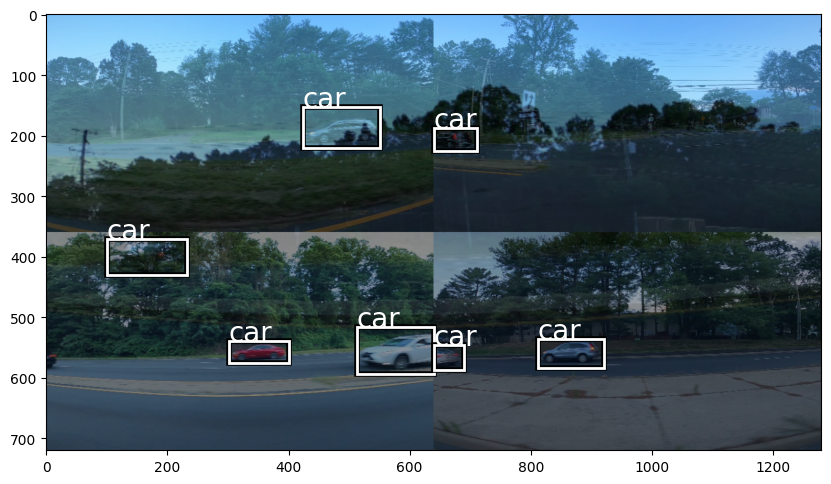

Image id: 848
Original Image size: (720, 1280)
Image size: (720, 1280, 3)


In [281]:
plot_mosaic(4)

### Add transforms 

In [282]:
def create_post_mosaic_transform(
        output_height,
        output_width,
        pad_colour=(0, 0, 0),
        rotation_range=(-10, 10),
        shear_range=(-10, 10),
        translation_percent_range=(-0.2, 0.2),
        scale_range=(0.08, 1.0),
        apply_prob=0.8,
):
    return A.Compose(
        [
            A.Affine(
                cval=pad_colour,
                rotate=rotation_range,
                shear=shear_range,
                translate_percent=translation_percent_range,
                scale=None,
                keep_ratio=True,
                p=apply_prob,
            ),
            A.HorizontalFlip(),
            A.RandomResizedCrop(height=output_height, width=output_width, scale=scale_range),
        ],
        bbox_params=A.BboxParams(format="pascal_voc", label_fields=["labels"], min_visibility=0.25),
    )

In [283]:
mds = MosaicMixupDataset(ds, apply_mixup_probability=0.2, post_mosaic_transforms=create_post_mosaic_transform(640, 640))

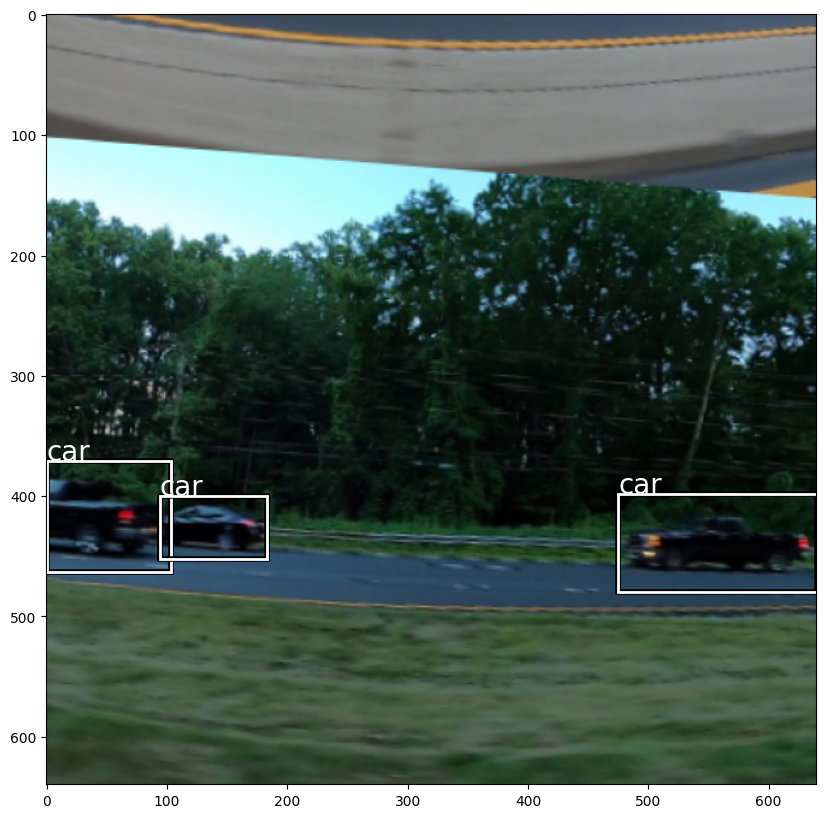

Image id: 848
Original Image size: (720, 1280)
Image size: (640, 640, 3)


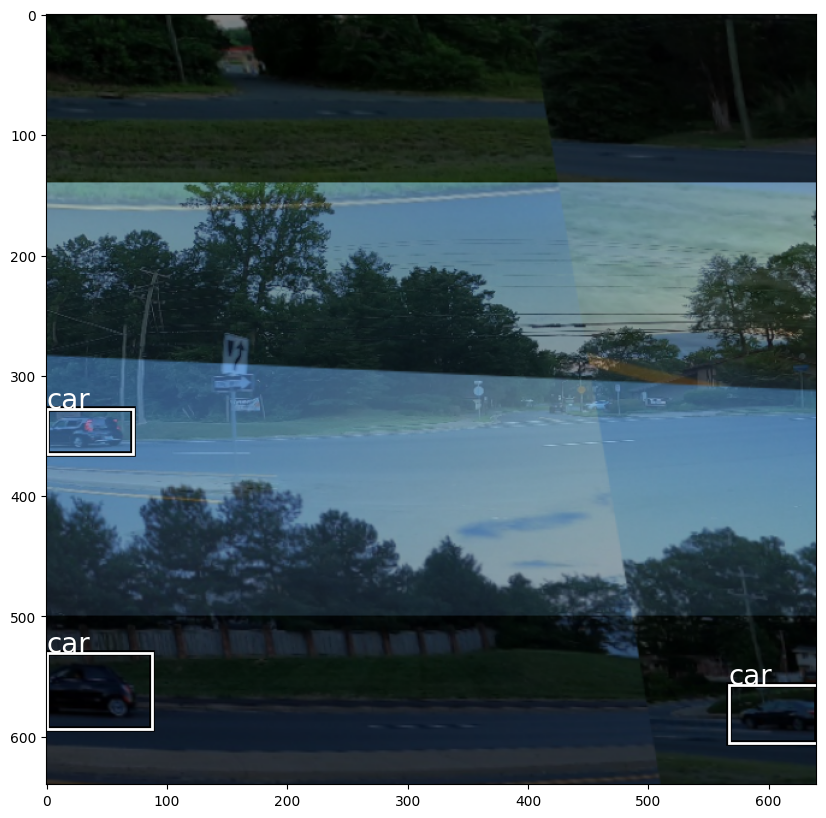

Image id: 848
Original Image size: (720, 1280)
Image size: (640, 640, 3)


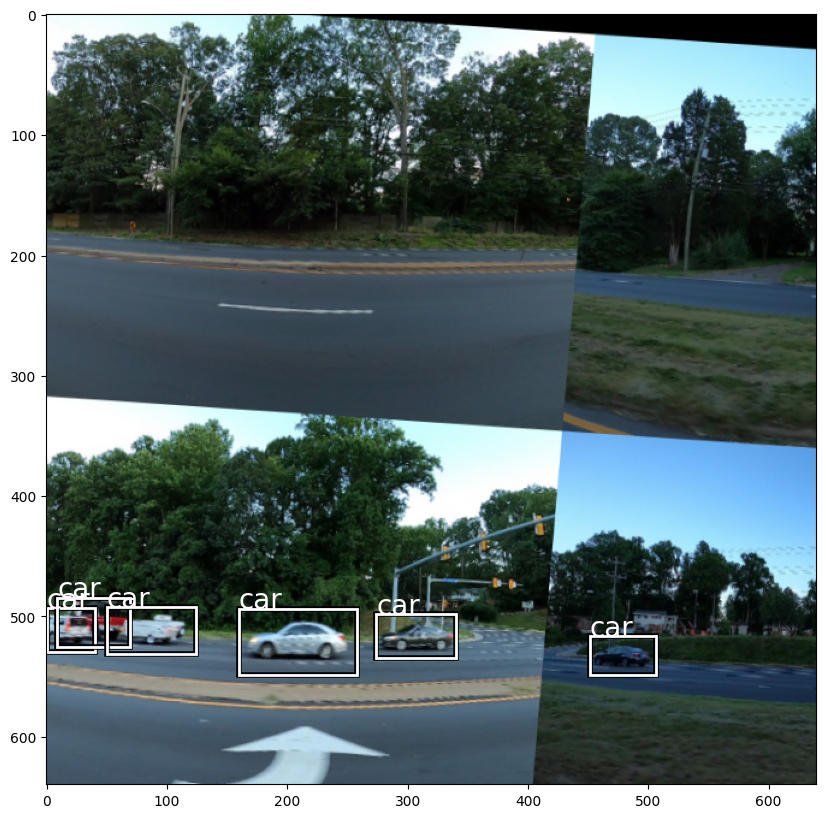

Image id: 848
Original Image size: (720, 1280)
Image size: (640, 640, 3)


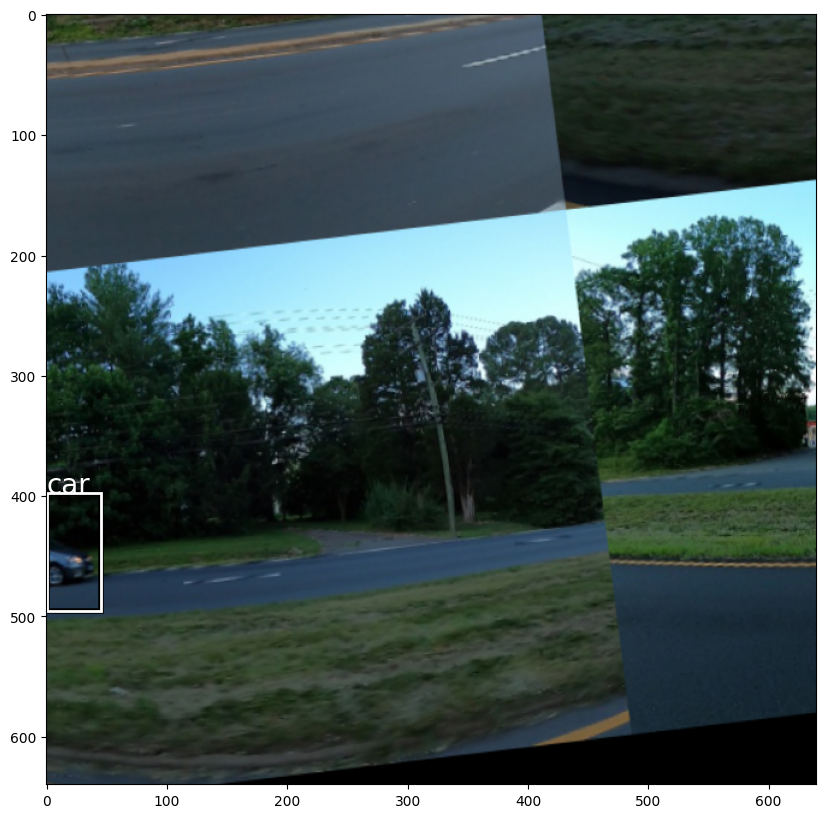

Image id: 848
Original Image size: (720, 1280)
Image size: (640, 640, 3)


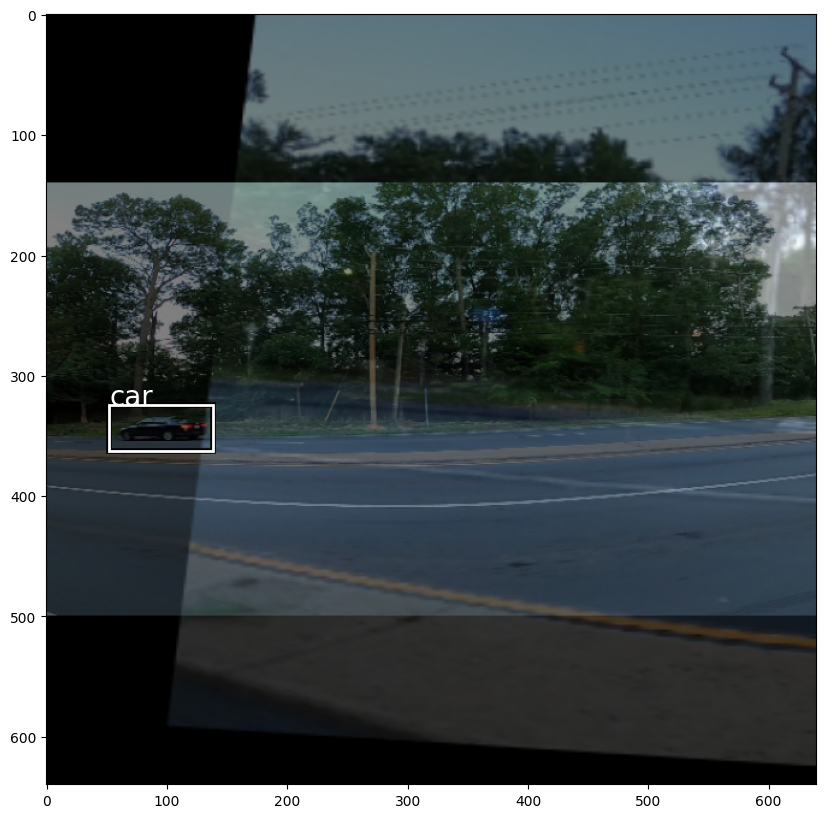

Image id: 848
Original Image size: (720, 1280)
Image size: (640, 640, 3)


In [285]:
for i in range(5):
    plot_mosaic(4)

### EMA? 

## Run training